#SETs

In [107]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [108]:
!git clone https://github.com/mastryukov1990/mok_mas_gan2

fatal: destination path 'mok_mas_gan2' already exists and is not an empty directory.


In [109]:
import torch
import torch.nn as nn
import torch.utils.data as data
from torchvision import transforms
from torchvision import datasets
from torch import functional as F
from torchvision.models import vgg19
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import sys

In [112]:
sys.path.append("/content/mok_mas_gan2")

In [110]:
b = list()
b 

[]

In [111]:
from RaGAN import *
# from RaGAN.AL import AL
from RaGAN.DAL import DAL
from RaGAN.GAL import GAL
from RaGAN.Loss import MeanLoss, Loss
from RaGAN.SGRL import SGRL
from RaGAN.GL import GeometricLoss
from RaGAN.FML import FML
from RaGAN.HGAL import HGAL
from RaGAN.HDAL import HDAL
from RaGAN.conf import IMSIZE, DEVICE
from RaGAN.utils import imshow, give_net
IMSIZE=512

In [60]:
img = Image.open('/content/mok_mas_gan2/RaGAN/256_256.jpg')
print(img.size)

(256, 256)


In [113]:
normal_transform = transforms.Compose(
    [
     transforms.ToTensor(),
     transforms.Resize((IMSIZE,IMSIZE), interpolation=Image.BICUBIC),
     transforms.Normalize(mean=[0.5] * 3, std=[0.5] * 3)
     ]
)

In [62]:
tr_img = normal_transform(img)


In [63]:
print(tr_img.size())



torch.Size([3, 512, 512])


In [64]:
def mask_image(image, mask_h, mask_w):
    sz = image.size()
    mask = torch.ones_like(image)
    rand_h = random.randint(0, sz[-2] - mask_h)
    rand_w = random.randint(0, sz[-1] - mask_w)
    mask[:, rand_h:rand_h + mask_h:, rand_w:rand_w + mask_w:] = 0
    return image * mask

In [65]:
class MaskTransform(object):
    def __init__(self, image_size, random  = False):
        assert isinstance(image_size, (int, tuple))
        self.random = random 
        self.image_size = image_size

    def __call__(self, image):
        return self.__mask_image(image, self.image_size // 2, 
                                        self.image_size // 2) 
        

    def __mask_image(self, image, mask_h, mask_w):
        sz = image.size()
        mask = torch.zeros_like(image)
        rand_h =  sz[-2]//2 - mask_h//2
        rand_w =  sz[-1]//2 - mask_w//2
        if self.random:
          rand_h = random.randint(0, sz[-2] - mask_h)
          rand_w = random.randint(0, sz[-1] - mask_w)
        mask[:, rand_h:rand_h + mask_h:, rand_w:rand_w + mask_w:] = 1
        return image * (1 - mask), mask

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


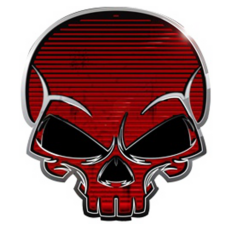

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


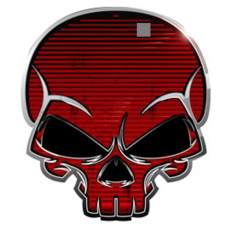

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


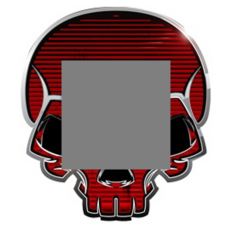

In [114]:
imshow(tr_img)
masked_image = mask_image(tr_img, 32, 32)

another_masked_image, mask = MaskTransform(512)(tr_img)
imshow(masked_image)
imshow(another_masked_image)

In [ ]:
gen = JsonDataLoader('/content/mok_mas_gan2/RaGAN/generator.json')
gen_params = gen.get_data()

dis = JsonDataLoader('/content/mok_mas_gan2/RaGAN/d_2.json')
dis_params = dis.get_data()

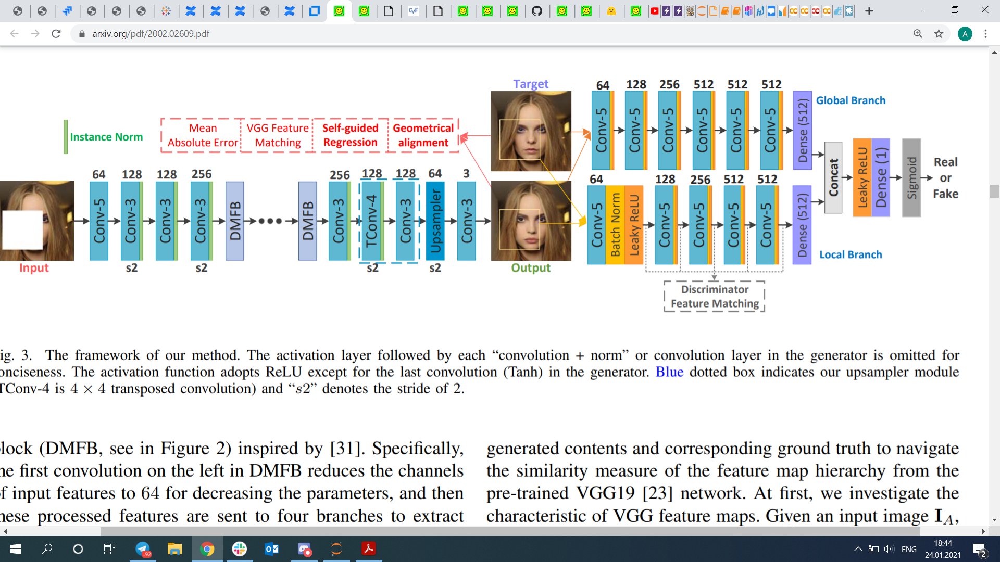

In [68]:
class Line(nn.Module):
  def __init__(self,kernel= 3):
    super(Block, self).__init__()
    self.block = nn.Sequential(
                    nn.Conv2d(2**(6+i), 2**(6+j), kernel, stride =2,padding = (kernel-1)//2),
                    nn.BatchNorm2d(2**(6+j)), 
                    nn.LeakyReLU())
  
  def forward(self, x):
    return self.block(x)

In [90]:
class Branch(nn.Module):
  def __init__(self, num_layers = 6, im_size=256, kernel = 3, height = 3, output = 512 ):
    super(Branch, self).__init__()
    self.num_layers = num_layers
    self.hat = nn.Sequential(*[nn.Conv2d(3, 64, kernel, stride =2, padding = (kernel-1)//2), nn.BatchNorm2d(64), nn.LeakyReLU()])
    self.body = nn.Sequential(
                  *[ Block(i,i+1, kernel) 
                  if i <height
                  else Block(3,3, kernel )
                  for i in range(num_layers-1)  
                ])
    # print(im_size /2**(num_layers))
    self.tail = nn.Sequential(*[nn.Linear((im_size//2**(num_layers))**2 *2**(9), output )])
    self.model = nn.Sequential( self.hat, self.body, self.tail)

  def forward(self, x):
    x = self.hat(x)
    x = self.body(x)
    x = x.resize(x.shape[0],x.shape[1]*x.shape[2]*x.shape[3])
    x = self.tail(x)
    return x


GLobal_B= Branch(im_size  = 512)
Local_b  =Branch(5,256,3)
wimg = torch.cat([tr_img.unsqueeze(0), tr_img.unsqueeze(0)],0)
GLobal_B(wimg)
s_wimg=transforms.Resize(256)(wimg)
Local_b(s_wimg)

/usr/local/lib/python3.6/dist-packages/torch/tensor.py:447: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[ 0.2836,  0.5168, -0.3688,  ...,  0.0200,  0.4266, -0.1057],
        [ 0.2836,  0.5168, -0.3688,  ...,  0.0200,  0.4266, -0.1057]],
       grad_fn=<AddmmBackward>)

In [73]:
wimg.shape

torch.Size([2, 3, 512, 512])

In [91]:
class Discriminator(nn.Module):
  def __init__(self
               , num_layers_g=6
               , im_size_g=256
               , im_size_l = 128
               , num_layers_l = 5
               , kernel_l=3
               , kernel_g = 3):
    super(Discriminator, self).__init__()

    self.g_branch = Branch(num_layers_g, im_size_g,kernel_g, )
    self.l_branch = Branch(num_layers_l, im_size_l, kernel_l)
    self.tail = nn.Linear(1024,1)

  def forward(self,x, y):
    x = self.g_branch(x)
    y = self.l_branch(y)
    xy= torch.cat([x,y],1)
    return self.tail(xy)

d = Discriminator(im_size_g = 512, im_size_l = 256)
d.forward(wimg, s_wimg)
# d.g_branch(wimg)

# wimg

/usr/local/lib/python3.6/dist-packages/torch/tensor.py:447: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


tensor([[-0.2183],
        [-0.2183]], grad_fn=<AddmmBackward>)

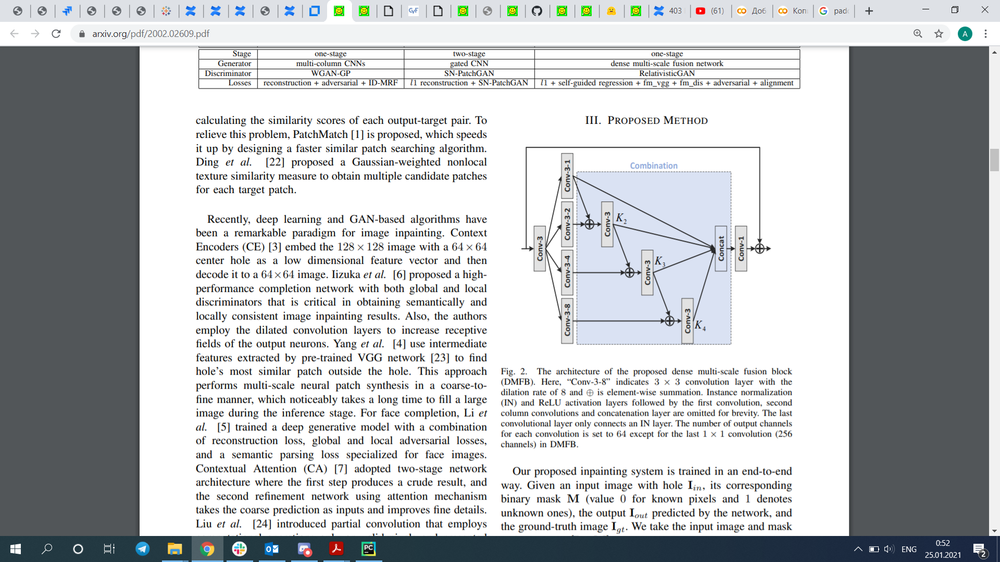

In [95]:
class DMFB(nn.Module):
    def __init__(self, 
                 inf=256, 
                 out=256,
                 num_parallel = 4, 
                 kernel = 3,
                 num_concat = 3,
                 features_parall = 64, 
                 features_con = 64):
        super(DMFB, self).__init__()
        self.hat = nn.Sequential(nn.Conv2d(inf,features_parall,kernel,padding = (kernel-1)//2 ),
                                 nn.InstanceNorm2d(features_parall),
                                 nn.ReLU())
        self.parallel_list = nn.ModuleList(
            [nn.Conv2d(features_parall, 
                       features_con, 
                       kernel,
                       dilation = 2**i,
                       padding=(kernel-1)//2*2**i) 
            for i in range(num_parallel)]
        )
        self.concat_list = nn.ModuleList(
            [nn.Conv2d(features_con, 
                       features_con, 
                       kernel,
                       padding=(kernel-1)) 
            for i in range(num_concat)]
        )
        self.cat_norm_act = nn.Sequential(
                                nn.InstanceNorm2d(features_parall*(num_concat+1)),
                                nn.ReLU()
                                )
        self.last_conv = nn.Conv2d(features_con*num_concat + features_parall
                                   , out
                                   , kernel, padding  =(kernel-1)//2 )

    def __call__(self, x, **kwargs):
        return self.forward(x)

    def forward(self, x, **kwargs):
        y = self.hat(x)

        temp_output = [module(y) for module in self.parallel_list]
        for p, q, layer in zip(temp_output[:-1], temp_output[1:], self.concat_list):
            q = layer(p + q)
        # print(len(temp_output))
        combined = torch.cat(temp_output, dim=1)  # channels concat
        # print(x.shape)
        last =self.last_conv(self.cat_norm_act(combined))
        # print(last.shape)
        return x + last
dm = DMFB()
# dm(torch.cat([wimg]*84,1))

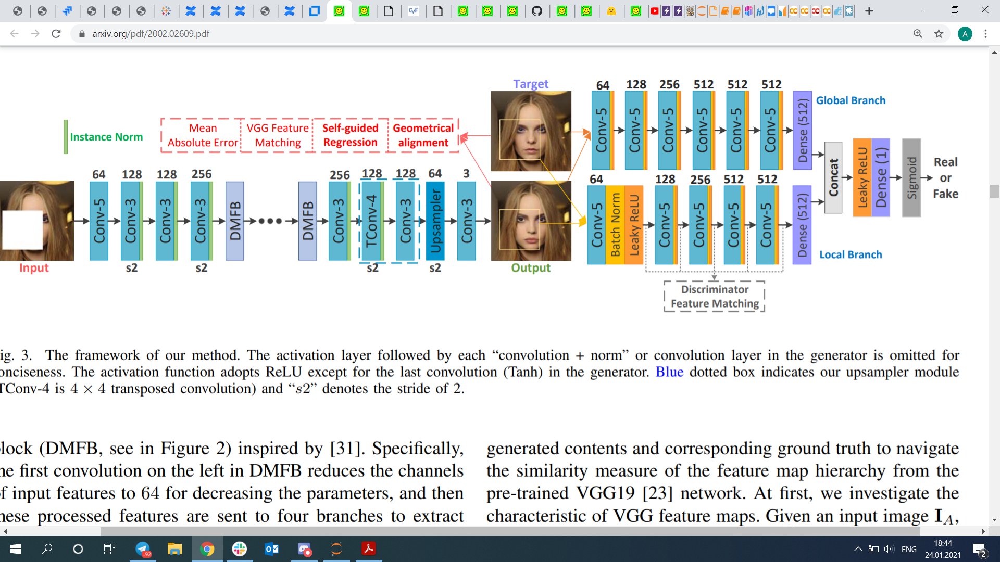

In [96]:
class Generator(nn.Module):
  def __init__(self, inf = 3,out=128, kernel=3):
    super(Generator, self).__init__()
    self.head = nn.Sequential(
      nn.Conv2d(3,64,5,(kernel-1)//2),
      nn.InstanceNorm2d(64),
      nn.Conv2d(64,128,kernel,padding= (kernel-1)//2, stride = 2),
      nn.InstanceNorm2d(128),
      nn.Conv2d(128, 128, kernel,padding=(kernel-1)//2),
      nn.InstanceNorm2d(128),
      nn.Conv2d(128,256,kernel,padding=(kernel-1)//2, stride = 2),
      nn.InstanceNorm2d(256),
    )
    self.body = nn.Sequential(DMFB() , DMFB())
    self.tail = nn.Sequential(
        nn.Conv2d(256, 128, kernel, padding=(kernel-1)//2),
        nn.InstanceNorm2d(128),
        nn.ConvTranspose2d(128, 128, 4, 2 ),
        nn.InstanceNorm2d(128),
        nn.Conv2d(128,64, kernel , padding=(kernel-1)//2),
        nn.ConvTranspose2d(64, 64, kernel , 2,padding=(kernel -1)//2),
        nn.InstanceNorm2d(64),
        nn.Conv2d(64,64, kernel,padding= (kernel- 1)//2),
        nn.Conv2d(64, 3, kernel,padding= (kernel -1)//2)
    )

  def forward(self,x):
      y = self.head(x)
      y = self.body(y)
      y = self.tail(y)
      return y
G(wimg)
print('Ok')

Ok


In [97]:
TRAIN_PATH = './train_data/'
TEST_PATH = './test_data'
IMAGE_SIZE = 256
IMSIZE = 256
CROP_SIZE = 160
BATCH_SIZE = 8



In [98]:

!mkdir data_faces && wget https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip 

--2021-02-11 15:30:29--  https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip
Resolving s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)... 52.219.116.232
Connecting to s3-us-west-1.amazonaws.com (s3-us-west-1.amazonaws.com)|52.219.116.232|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1443490838 (1.3G) [application/zip]
Saving to: ‘celeba.zip’

celeba.zip          100%[===================>]   1.34G  35.5MB/s    in 51s     

2021-02-11 15:31:20 (26.8 MB/s) - ‘celeba.zip’ saved [1443490838/1443490838]



In [99]:
import zipfile

with zipfile.ZipFile("celeba.zip","r") as zip_ref:
  zip_ref.extractall("data_faces/")



In [ ]:
#train_data = datasets.CelebA(TRAIN_PATH, 'train', transform=normal_transform, download=True)
#test_data = datasets.CelebA(TEST_PATH, 'test', transform=normal_transform, download=True)

In [100]:
celeba_transform = transforms.Compose(
    [
     transforms.CenterCrop((CROP_SIZE, CROP_SIZE)),
     transforms.ToTensor(),
     transforms.Resize((IMSIZE,IMSIZE), interpolation=Image.BICUBIC),
     transforms.Normalize(mean=[0.5] * 3, std=[0.5] * 3),
    ]
)

In [117]:
class MaskDataset:
    def __init__(self, data_path, data_transform, mask_transform):
        self.dataholder = datasets.ImageFolder(data_path, transform=data_transform)
        self.mask_transform = mask_transform
        

    def __len__(self):
        return len(self.dataholder) //10

    def __getitem__(self, idx):
        image, label = self.dataholder.__getitem__(idx)
        masked_image = None
        if self.mask_transform is not None:
            masked_image, mask = self.mask_transform(image)
        if masked_image is not None:
            return {"gt" : image, "masked" : masked_image, "mask" : mask}
        return image
        



In [116]:
celeba_data = datasets.ImageFolder('./data_faces', transform=celeba_transform)
data_loader = data.DataLoader(celeba_data, batch_size=BATCH_SIZE, shuffle=True)

celeba_dataset = MaskDataset(data_path='./data_faces', 
                             data_transform=celeba_transform, mask_transform=MaskTransform(IMAGE_SIZE))
celeba_loader = data.DataLoader(celeba_dataset, batch_size=BATCH_SIZE, shuffle=True)


In [120]:
# for image in celeba_loader:
    # imshow(image["gt"][0])
target = celeba_dataset[0]['masked']
target_gt = celeba_dataset[0]['gt']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


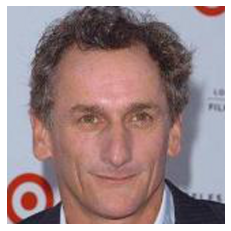

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


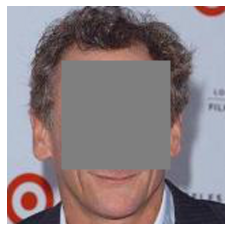

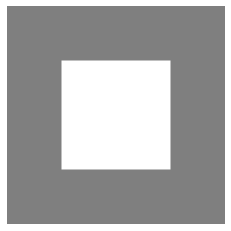

torch.Size([3, 256, 256])

In [121]:
batch = next(iter(celeba_loader))
gt = batch['gt'][0]
imshow(batch['gt'][0])
imshow(batch['masked'][0])
imshow(batch['mask'][0])
img = batch['masked'][0]
img.size()

In [122]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# valid = mask
#   requires_grad(G, False)
#   requires_grad(D, True)

#   # imshow(valid[0])
#   fake = G(valid)
#   fake_pred = D(fake)

#   gt_pred = D(ground_truth)

#   true_label = torch.ones(ground_truth.shape[0],1)
#   fake_label= true_label*0

#   D.zero_grad()  
#   # print(ground_truth.size(), fake.size())
#   fmloss, D_fake_label, D_gt_label = fml(fake,ground_truth,
#                                          D.local_branch)
#   x1 = D.dense_local_branch(torch.cat(
#                                 [D_fake_label.view(D_fake_label.shape[0],-1) ,
#                                 D_gt_label.view(D_fake_label.shape[0],-1)], 0 ))
  
#   x2 = D.global_branch(torch.cat([fake,ground_truth], 0))
#   # print(x2.size())
#   x2 = D.dense_global_branch( x2.view(x2.shape[0],-1))
#   print(D.neck, x2.size())
#   y = D.neck(torch.cat([x1,x2],1))
#   # print(y.size(), x1.size(), x2.size())
#   D_loss = al(torch.cat([fake_label,true_label]).view(-1), y) + 20*fmloss
#   D_loss.backward()

#   D_opt.step()

#   requires_grad(G, True)
#   requires_grad(D, False)

#   fake = G(valid)
#   fake_pred = D(fake)
  
#   D_fake_label = D(fake)
#   D_true_label = D(ground_truth)
#   # print(mse(fake,ground_truth ))
#   G.zero_grad()
#   G_loss = mse(fake,ground_truth ) \
#       + 20*fml(ground_truth, fake, vgg19(True).features[:5].to(DEVICE))[0] \
#       + sgrl(ground_truth, fake)  + 20*gl(fake, ground_truth )

  
#   G_loss.backward()
#   G_opt.step()

#   return  G_loss, D_loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


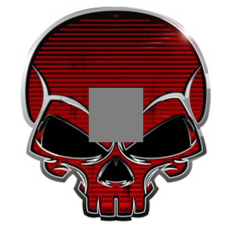

In [123]:
def cut_images(images, masks):
    # mask - рандомно расположенный квадратик размером половины картинки
    return torch.cat([image[mask==1].view(1, 3, mask.shape[1] // 2, mask.shape[2] // 2) \
                         for image, mask in zip(images, masks)], dim=0)

tr = MaskTransform(IMAGE_SIZE)

masked, mask = tr(tr_img)

# res = cut_images([tr_img, tr_img], [mask, mask])
imshow(masked)
# imshow(res[0])


In [124]:
def requires_grad(model, flag=True):
    for param in model.parameters():
        param.requires_grad = flag

In [125]:
class GeometricLoss(Loss):
    def __init__(self, *args, **kwargs):
        super(GeometricLoss, self).__init__()
        self.net = give_net(vgg19(True).features[:], 5).to(DEVICE)

    def forward(self, output, target, *args, **kwargs):
        output = self.net(output)
        target = self.net(target)

        vectorH = torch.Tensor([i for i in np.arange(output.size()[-1])]).to(DEVICE)
        vectorW = torch.Tensor([i for i in np.arange(output.size()[-2])]).to(DEVICE)

        d_o = output @ vectorH / output.sum()
        w_o = vectorW @ output / output.sum()
        d_t = target @ vectorH / target.sum()
        w_t = vectorW @ target / target.sum()

        return ((d_t - d_o) ** 2 + (w_t - w_o) ** 2).sum()

model = vgg19(True).features[:]
give_net(model, 5).to(DEVICE)
t  = GeometricLoss()
t.net

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
)

In [126]:
fml = FML()
fml_gen = FML()
# al = AdversialLoss()
# al_gen = AdversialLoss()
gal = GAL()
dal = DAL()
mse = MeanLoss()
sgrl = SGRL()
gl = GeometricLoss()

hgal = HGAL()
hdal  = HDAL()

label = torch.Tensor([1,1,1])
f_label = torch.Tensor([0,0,0])
hgal(f_label, label)

tensor(0.)

#TRAIN

In [ ]:
D = Discriminator(dis_params).to(DEVICE)
G = Generator(gen_params).to(DEVICE)
chek = torch.load('/content/drive/MyDrive/RaGAN/Gen_1__2__3____66_5')
G.load_state_dict(chek['G_model_state_dict'])
D.load_state_dict(chek['D_model_state_dict'])
G_opt = torch.optim.AdamW(G.parameters(), lr=1e-4)
G_opt.load_state_dict(chek['G_opt_state_dict'])
D_opt = torch.optim.AdamW(D.parameters(), lr=1e-4)
D_opt.load_state_dict(chek['D_opt_state_dict'])
opt = [G_opt, D_opt]


In [ ]:
# chek.keys()

## Train cikl

In [ ]:
def train_D(data, G, D, D_opt, D_sched):

    images = data["gt"].to(DEVICE)
    masked = data["masked"].to(DEVICE)
    masks = data["mask"].to(DEVICE)

    batch_sz = images.size(0)
    
    requires_grad(G, False)
    requires_grad(D, True)

    gen_images = G(masked)
    # gen_predictions = D(gen_images)
    # gt_predictions = D(images)

    cut_gt_images = cut_images(images, masks)
    cut_gen_images = cut_images(gen_images, masks)

    true_label = torch.ones(images.size(0)).to(DEVICE)
    fake_label = torch.zeros_like(true_label).to(DEVICE)

    D.zero_grad()
    fmloss, D_gen_label, D_gt_label = fml(cut_gen_images, cut_gt_images, 
                                            D.local_branch)

    x_local = D.dense_local_branch(torch.cat((D_gen_label.view(batch_sz, -1),
                                        D_gt_label.view(batch_sz, -1)), dim=0))
    
    x_global = D.global_branch(torch.cat((gen_images, images), dim=0))
    x_global = D.dense_global_branch(x_global.view(x_global.size(0), -1))

    y = D.neck(torch.cat([x_local, x_global], dim=1))

    # D_loss = 0.03 * dal(torch.cat([fake_label,true_label], dim=0).view(-1), y) + 20*fmloss
    D_loss =  0.03 * dal(y[:batch_sz], y[batch_sz:]) + 20*fmloss
    D_loss.backward()
    D_opt.step()

    D_sched.step()

    return D_loss

In [ ]:
# class HearRaLoaa(Loss):
#   def __init__(self):
#     super(HearRaLoss, self).__init__()
  
#   def forward(self, y_pred, y_pred_fake):
#     return e(torch.mean(torch.nn.ReLU()(1.0 + (y_pred - torch.mean(y_pred_fake)))) + torch.mean(torch.nn.ReLU()(1.0 - (y_pred_fake - torch.mean(y_pred)))))/2

In [ ]:
j = 0
def train_epoch(train_loader, G, D, G_opt, D_opt, G_sched, D_sched):
    global j
    j += 1
    running_D_loss = 0.0
    running_G_loss = 0.0
    for i, data in enumerate(train_loader):
        # print(j)
        j += 1
        G.train()
        D.train()
        batch_sz = data["gt"].size(0)

        D_loss = train_D(data, G, D, D_opt, D_sched)
        G_loss = train_G(data, G, D, G_opt, G_sched)

        if j % 20 == 0:
            with torch.no_grad():
                G.eval()
                gen_batch = G(data["masked"].to(DEVICE))
                gen_img = gen_batch[0].to(DEVICE)
                img = data["gt"][0].to(DEVICE)
                f_img = img * (1.0 - data["mask"][0].to(DEVICE)) \
                        + gen_img * data["mask"][0].to(DEVICE)
                
                # imshow(img.cpu())
                # imshow(gen_img.cpu())
                # imshow(f_img.cpu())
                # imshow(G(target.view(1, 3, 128, 128).to(DEVICE))[0].cpu())
                # imshow(target_gt.cpu())

        running_D_loss += D_loss.item() * batch_sz
        running_G_loss += G_loss.item() * batch_sz
        
    running_D_loss /= len(train_loader.dataset)
    running_G_loss /= len(train_loader.dataset)

    return running_D_loss, running_G_loss

#   fake = G(valid)
#   fake_pred = D(fake)
  
#   D_fake_label = D(fake)
#   D_true_label = D(ground_truth)
#   # print(mse(fake,ground_truth ))
#   G.zero_grad()
#   G_loss = mse(fake,ground_truth ) \
#       + 20*fml(ground_truth, fake, vgg19(True).features[:5].to(DEVICE))[0] \
#       + sgrl(ground_truth, fake)  + 20*gl(fake, ground_truth )

  
#   G_loss.backward()
#   G_opt.step()

#   return  G_loss, D_loss


In [ ]:
from tqdm import tqdm



def train_loop(train_loader, G, D, G_opt, D_opt,epochs=10000, show_progress_bar=True):
    # G_opt = torch.optim.AdamW(G.parameters(), lr=1e-3)
    # D_opt = torch.optim.AdamW(D.parameters(), lr=1e-3)

    G_sched = torch.optim.lr_scheduler.CosineAnnealingLR(G_opt, 2)
    D_sched = torch.optim.lr_scheduler.CosineAnnealingLR(D_opt, 2)

    progress_bar = tqdm(total=epochs)
    loss_history = {'D_loss' : [], 'G_loss' : []}

    for epoch in range(epochs):
        D_loss, G_loss = train_epoch(celeba_loader, G, D, G_opt,                            D_opt, G_sched, D_sched)

        loss_history['D_loss'].append(D_loss)
        loss_history['G_loss'].append(G_loss)
        progress_bar.set_postfix({"D_loss": D_loss, "G_loss": G_loss})
        progress_bar.update(1)
        if epoch%1==0:
          torch.save({'model_state_dict': G.state_dict(),
            'opt_state_dict': G_opt.state_dict(),}, '/content/drive/MyDrive/RaGAN/Gen_{}'.format(epoch))

    progress_bar.close()
    return loss_history

In [ ]:
def train_loop1(train_loader, G, D, G_opt, D_opt,epochs=10000, show_progress_bar=True):
    # G_opt = torch.optim.AdamW(G.parameters(), lr=1e-3)
    # D_opt = torch.optim.AdamW(D.parameters(), lr=1e-3)

    G_sched = torch.optim.lr_scheduler.CosineAnnealingLR(G_opt, 2)
    D_sched = torch.optim.lr_scheduler.CosineAnnealingLR(D_opt, 2)

    progress_bar = tqdm(total=epochs)
    loss_history = {'D_loss' : [], 'G_loss' : []}

    for epoch in range(epochs):
        D_loss = train_epoch1(celeba_loader, G, D, G_opt, D_opt, G_sched, D_sched)

        loss_history['D_loss'].append(D_loss)
        # loss_history['G_loss'].append(G_loss)
        progress_bar.set_postfix({"D_loss": D_loss,
                                  # "G_loss": G_loss
                                  })
        progress_bar.update(1)
        # if epoch%1==0:
          # print(D_loss)
          # print(D(wimg).item())
          # print(G())
        torch.save({'G_model_state_dict': G.state_dict(),
          'G_opt_state_dict': G_opt.state_dict(),
          'D_model_state_dict': D.state_dict(),
          'D_opt_state_dict' : D_opt.state_dict(),
          'D_sched_state_dict': D_sched.state_dict(),
          'G_sched_state_dict': G_sched.state_dict()
          }
          , f'/content/drive/MyDrive/RaGAN/Gen_1__2__3____66_{epoch}'.format(epoch))

    progress_bar.close()
    return loss_history

In [ ]:
j = 0
def train_epoch1(train_loader, G, D, G_opt, D_opt, G_sched, D_sched):
    global j
    j += 1
    running_D_loss = 0.0
    running_G_loss = 0.0
    bar = tqdm(total = len(train_loader))
    for i, data in enumerate(train_loader):
        # print(j)
        j += 1
        G.train()
        D.train()
        batch_sz = data["gt"].size(0)

        D_loss,pres = train_D1(data, G, D, D_opt, D_sched)
        G_loss = train_G(data, G, D, G_opt, G_sched)

        if j % 20 == 0:
            with torch.no_grad():
                G.eval()
                gen_batch = G(data["masked"].to(DEVICE))
                gen_img = gen_batch[0].to(DEVICE)
                img = data["gt"][0].to(DEVICE)
                f_img = img * (1.0 - data["mask"][0].to(DEVICE)) \
                        + gen_img * data["mask"][0].to(DEVICE)
                
                # imshow(img.cpu())
                # imshow(gen_img.cpu())
                # imshow(f_img.cpu())
                # imshow(G(target.view(1, 3, 128, 128).to(DEVICE))[0].cpu())
                # imshow(target_gt.cpu())
                # print(D(img).item())
        bar.set_postfix({'D_pred':pres,'D_los':D_loss})
        bar.update(1)
        running_D_loss += D_loss.item() * batch_sz
        running_G_loss += G_loss.item() * batch_sz
        # bar.close()
    running_D_loss /= len(train_loader.dataset)
    running_G_loss /= len(train_loader.dataset)

    return running_D_loss, running_G_loss


In [ ]:
def train_G(data, G, D, G_opt, G_sched):
    D.eval()
    G.train()
    images = data["gt"].to(DEVICE)
    masked = data["masked"].to(DEVICE)
    masks = data["mask"].to(DEVICE)

    batch_sz = images.size(0)

    requires_grad(G, True)
    requires_grad(D, False)

    gen_images = G(masked)

    cut_gt_images = cut_images(images, masks)
    cut_gen_images = cut_images(gen_images, masks)

    
    # gt_predictions = D(images, cut_gt_images)
    # gen_predictions = D(gen_images, cut_gen_images)

    images_gen_gt = torch.cat([gen_images , images], 0)
    mask_gen_gt = torch.cat([cut_gen_images, cut_gt_images], 0)

    l  = D.local_branch(mask_gen_gt)
    g  = D.global_branch(images_gen_gt)

    l1  = D.dense_local_branch(l.view(batch_sz*2,-1))
    g2 = D.dense_global_branch(g.view(batch_sz*2,-1))
    y  = D.neck( torch.cat([l1,g2],1))

    pred = D.last_act(y)
    print(f'\n train_G_D: {pred}\n train_G_D():{-1}')

    true_label = torch.ones(images.size(0)).to(DEVICE)
    fake_label = torch.zeros_like(true_label).to(DEVICE)

    G.zero_grad()

    # gal_loss = gal(torch.cat([fake_label, true_label], dim=0).view(-1), y )
    gal_loss = hgal(y[:batch_sz], y[batch_sz:] )


    
    mse_loss = mse(gen_images, images)
    fml_loss = fml(gen_images, images, vgg19(True).features[:5].to(DEVICE))[0]
    sgrl_loss = sgrl(gen_images, images) 
    gl_loss = gl(gen_images, images)

    G_loss = 1*mse_loss \
            + 20 * fml_loss \
            + 500*sgrl_loss + 600 * gl_loss \
            + 0.1 * gal_loss

    print(f'\n gal loss: {0.07*gal_loss.item()},\n mse_loss: {1*mse_loss.item()}, \
          \n fml_loss: {100*fml_loss.item()},\n sgrl_loss: {50000*sgrl_loss.item()},\
           \n gl_loss : {600*gl_loss.item()},\n G_loss: {G_loss.item()}')
    G_loss.backward()
    G_opt.step()
    # imshow(gen_images[0].detach().cpu())

    # G_sched.step()

    return G_loss

In [ ]:
def train_D1(data, G, D, D_opt, D_sched):

    images = data["gt"].to(DEVICE)
    masked = data["masked"].to(DEVICE)
    masks = data["mask"].to(DEVICE)

    batch_sz = images.size(0)
    
    requires_grad(G, False)
    requires_grad(D, True)

    gen_images = G(masked)
    # gen_predictions = D(gen_images)
    # gt_predictions = D(images)
    imshow(images[0].cpu())
    imshow(masked[0].cpu())
    imshow(gen_images[0].cpu())
    cut_gt_images = cut_images(images, masks)
    cut_gen_images = cut_images(gen_images, masks)

    true_label = torch.ones(images.size(0)).to(DEVICE)
    fake_label = torch.zeros_like(true_label).to(DEVICE)

    D.zero_grad()
    fmloss, D_gen_label, D_gt_label = fml(cut_gen_images, cut_gt_images, 
                                            D.local_branch)
    print(D_gen_label.shape)
    print('dfdfdf')
    x_local = D.dense_local_branch(torch.cat((D_gen_label.view(batch_sz, -1),
                                        D_gt_label.view(batch_sz, -1)), dim=0))
    
    x_global = D.global_branch(torch.cat((gen_images, images), dim=0))
    x_global = D.dense_global_branch(x_global.view(x_global.size(0), -1))

    y = D.neck(torch.cat([x_local, x_global], dim=1))
    pres=D.last_act(y)

    # D_loss = 0.003 * hdal(torch.cat([fake_label,true_label], dim=0).view(-1), y) + 20*fmloss
    D_loss = 0.003 * hdal(y[batch_sz:], y[:batch_sz])
    print(f'\n D_loss :{D_loss.item()}')
    D_loss.backward()
    D_opt.step()

    D_sched.step()

    return D_loss, pres

In [ ]:
t1 = torch.Tensor([0.9,0.9,0.9])
t2 = torch.Tensor([0.1,0.1,0.1])
hgal(t1,t2)


tensor(1.8000)

In [ ]:
from torch.nn import ReLU, Tanh
from torch import mean as mn
# from .Loss import Loss


# class HGAL(Loss):
#     def __init__(self):
#         super(HGAL, self).__init__()

#     def forward(self, y_pred_real, y_pred_fake):

t1 = torch.Tensor([-1,-1, -1])
t2 = torch.Tensor([1, 1,1 ])

def hgal1(y_pred_real, y_pred_fake):
        return mn(ReLU()(1.0 + (y_pred_real - mn(y_pred_fake))) + ReLU()(1.0 - (y_pred_fake - mn(y_pred_real))))/2

 
hgal1(t1, t2)

tensor(0.)

In [ ]:

t1 = torch.Tensor([4,4, 4])
t2 = torch.Tensor([40, 40, 40])
y_pred = t1
y_pred_fake = t2
torch.mean(torch.nn.ReLU()(1.0 + (y_pred - torch.mean(y_pred_fake)))) + torch.mean(torch.nn.ReLU()(1.0 - Tanh()(y_pred_fake - torch.mean(y_pred))))

tensor(0.)





  0%|          | 0/10000 [00:00<?, ?it/s]




  0%|          | 0/2533 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


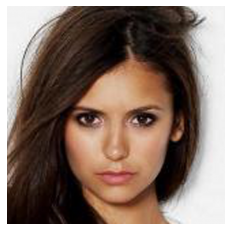

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


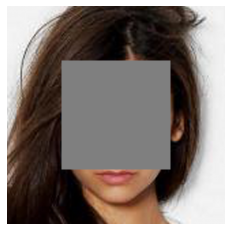

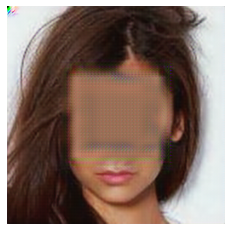

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0223],
        [0.0188],
        [0.0117],
        [0.0311],
        [0.0990],
        [0.0211],
        [0.0181],
        [0.1807],
        [0.9979],
        [0.9996],
        [0.9993],
        [0.9977],
        [1.0000],
        [0.9940],
        [0.9985],
        [0.9958]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.13823843002319336,           
 fml_loss: 1.0142819955945015,
 sgrl_loss: 3.9085316529963166,           
 gl_loss : 3.3098654821515083,
 G_loss: 3.6900455951690674







  0%|          | 0/2533 [00:04<?, ?it/s, D_pred=tensor([[0.0817],
        [0.5359],
        [0.0418],
        [0.1581],
        [0.5235],
        [0.1647],
        [0.2924],
        [0.5655],
        [0.9937],
        [0.9978],
        [0.9716],
        [0.9921],
        [0.9966],
        [0.8927],
        [0.9952],
        [0.9535]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 1/2533 [00:04<3:30:09,  4.98s/it, D_pred=tensor([[0.0817],
        [0.5359],
        [0.0418],
        [0.1581],
        [0.5235],
        [0.1647],
        [0.2924],
        [0.5655],
        [0.9937],
        [0.9978],
        [0.9716],
        [0.9921],
        [0.9966],
        [0.8927],
        [0.9952],
        [0.9535]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for i

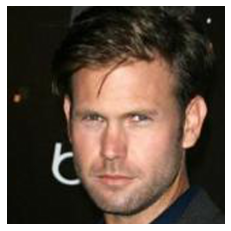

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


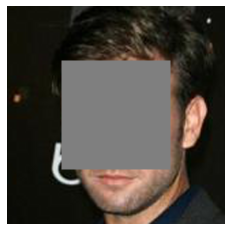

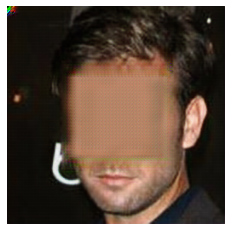

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0281],
        [0.0618],
        [0.0235],
        [0.0974],
        [0.0251],
        [0.1058],
        [0.0747],
        [0.2432],
        [0.9981],
        [0.9982],
        [0.9975],
        [0.9979],
        [0.9944],
        [0.9991],
        [0.9999],
        [0.9999]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.11188944429159164,           
 fml_loss: 0.9357759729027748,
 sgrl_loss: 2.0973486243747175,           
 gl_loss : 2.138548158109188,
 G_loss: 2.458566188812256







  0%|          | 1/2533 [00:10<3:30:09,  4.98s/it, D_pred=tensor([[0.2807],
        [0.2683],
        [0.0213],
        [0.4672],
        [0.0772],
        [0.7573],
        [0.1456],
        [0.6659],
        [0.9781],
        [0.9770],
        [0.9630],
        [0.9797],
        [0.8245],
        [0.9673],
        [0.9959],
        [0.9986]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 2/2533 [00:10<3:37:38,  5.16s/it, D_pred=tensor([[0.2807],
        [0.2683],
        [0.0213],
        [0.4672],
        [0.0772],
        [0.7573],
        [0.1456],
        [0.6659],
        [0.9781],
        [0.9770],
        [0.9630],
        [0.9797],
        [0.8245],
        [0.9673],
        [0.9959],
        [0.9986]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

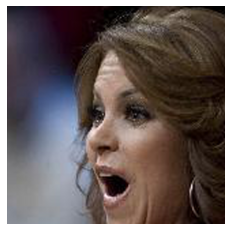

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


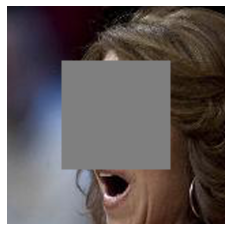

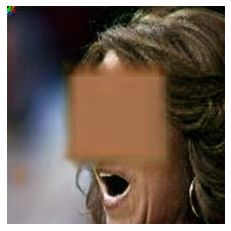

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0476],
        [0.1624],
        [0.2030],
        [0.2885],
        [0.0630],
        [0.0790],
        [0.0951],
        [0.2359],
        [0.9991],
        [0.9990],
        [0.9991],
        [0.9896],
        [0.9955],
        [0.9998],
        [0.9988],
        [0.9993]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.14673423767089844,           
 fml_loss: 0.9576475247740746,
 sgrl_loss: 3.4893098927568644,           
 gl_loss : 2.4607915431261063,
 G_loss: 2.8339483737945557







  0%|          | 2/2533 [00:15<3:37:38,  5.16s/it, D_pred=tensor([[0.1677],
        [0.1660],
        [0.8368],
        [0.2551],
        [0.0657],
        [0.1600],
        [0.2127],
        [0.4918],
        [0.9892],
        [0.9919],
        [0.9961],
        [0.8895],
        [0.8019],
        [0.9925],
        [0.9829],
        [0.9868]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 3/2533 [00:15<3:35:50,  5.12s/it, D_pred=tensor([[0.1677],
        [0.1660],
        [0.8368],
        [0.2551],
        [0.0657],
        [0.1600],
        [0.2127],
        [0.4918],
        [0.9892],
        [0.9919],
        [0.9961],
        [0.8895],
        [0.8019],
        [0.9925],
        [0.9829],
        [0.9868]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

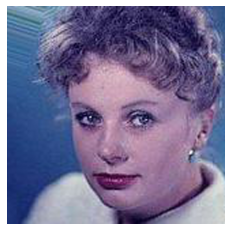

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


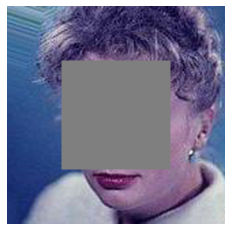

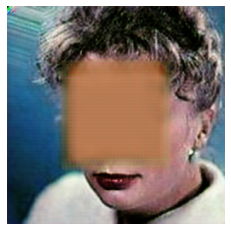

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.1174],
        [0.1245],
        [0.2696],
        [0.1671],
        [0.1581],
        [0.1408],
        [0.0874],
        [0.2558],
        [1.0000],
        [0.9992],
        [0.9997],
        [0.9974],
        [0.9982],
        [0.9993],
        [0.9999],
        [0.9965]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.16768380999565125,           
 fml_loss: 1.1597956530749798,
 sgrl_loss: 4.980644735042006,           
 gl_loss : 2.387562207877636,
 G_loss: 2.8370115756988525







  0%|          | 3/2533 [00:20<3:35:50,  5.12s/it, D_pred=tensor([[0.1021],
        [0.2036],
        [0.2351],
        [0.5837],
        [0.2814],
        [0.4136],
        [0.5413],
        [0.3897],
        [0.9915],
        [0.9924],
        [0.9871],
        [0.9592],
        [0.9708],
        [0.9634],
        [0.9900],
        [0.9714]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 4/2533 [00:20<3:32:58,  5.05s/it, D_pred=tensor([[0.1021],
        [0.2036],
        [0.2351],
        [0.5837],
        [0.2814],
        [0.4136],
        [0.5413],
        [0.3897],
        [0.9915],
        [0.9924],
        [0.9871],
        [0.9592],
        [0.9708],
        [0.9634],
        [0.9900],
        [0.9714]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

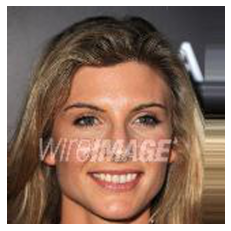

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


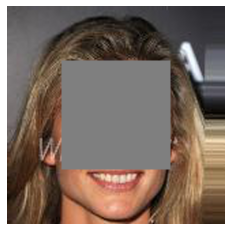

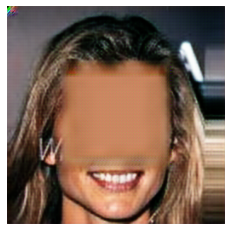

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0794],
        [0.0425],
        [0.1778],
        [0.0834],
        [0.2203],
        [0.1178],
        [0.1297],
        [0.0298],
        [0.9991],
        [0.9914],
        [0.9999],
        [0.9993],
        [0.9990],
        [0.9995],
        [0.9999],
        [0.9958]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.15153345465660095,           
 fml_loss: 1.0347726754844189,
 sgrl_loss: 4.383848136058077,           
 gl_loss : 2.316270489245653,
 G_loss: 2.718596935272217







  0%|          | 4/2533 [00:25<3:32:58,  5.05s/it, D_pred=tensor([[0.1802],
        [0.0710],
        [0.8349],
        [0.1107],
        [0.3166],
        [0.3867],
        [0.2049],
        [0.1872],
        [0.9758],
        [0.8601],
        [0.9955],
        [0.9841],
        [0.9798],
        [0.9924],
        [0.9972],
        [0.9536]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 5/2533 [00:25<3:30:09,  4.99s/it, D_pred=tensor([[0.1802],
        [0.0710],
        [0.8349],
        [0.1107],
        [0.3166],
        [0.3867],
        [0.2049],
        [0.1872],
        [0.9758],
        [0.8601],
        [0.9955],
        [0.9841],
        [0.9798],
        [0.9924],
        [0.9972],
        [0.9536]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

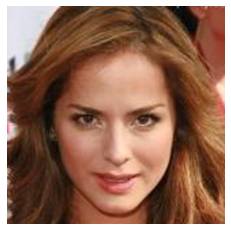

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


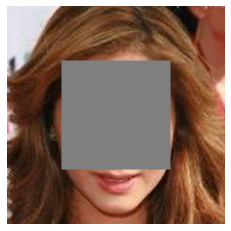

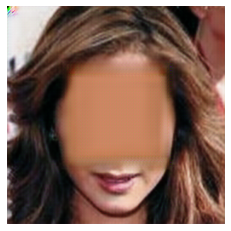

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0504],
        [0.0304],
        [0.0230],
        [0.0369],
        [0.0215],
        [0.0392],
        [0.0992],
        [0.0637],
        [0.9979],
        [0.9993],
        [0.9997],
        [0.9993],
        [0.9998],
        [0.9985],
        [0.9984],
        [0.9995]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.14541271328926086,           
 fml_loss: 1.0232983157038689,
 sgrl_loss: 3.7259487726259977,           
 gl_loss : 1.7895768396556377,
 G_loss: 2.1769087314605713







  0%|          | 5/2533 [00:30<3:30:09,  4.99s/it, D_pred=tensor([[0.1554],
        [0.6256],
        [0.1541],
        [0.2071],
        [0.1952],
        [0.0672],
        [0.1829],
        [0.4913],
        [0.9668],
        [0.9808],
        [0.9953],
        [0.9933],
        [0.9970],
        [0.9771],
        [0.9644],
        [0.9924]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 6/2533 [00:30<3:28:44,  4.96s/it, D_pred=tensor([[0.1554],
        [0.6256],
        [0.1541],
        [0.2071],
        [0.1952],
        [0.0672],
        [0.1829],
        [0.4913],
        [0.9668],
        [0.9808],
        [0.9953],
        [0.9933],
        [0.9970],
        [0.9771],
        [0.9644],
        [0.9924]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

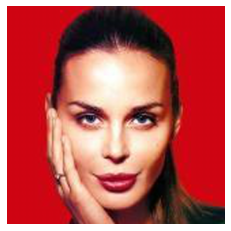

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


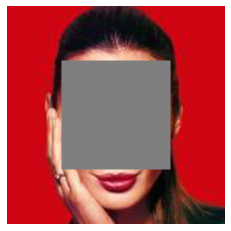

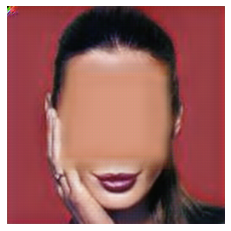

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0582],
        [0.0105],
        [0.0054],
        [0.0159],
        [0.0081],
        [0.0175],
        [0.0155],
        [0.0114],
        [1.0000],
        [1.0000],
        [0.9971],
        [0.9983],
        [0.9999],
        [0.9999],
        [1.0000],
        [0.9982]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.18025235831737518,           
 fml_loss: 1.178986206650734,
 sgrl_loss: 6.101336839492433,           
 gl_loss : 2.5419987738132477,
 G_loss: 3.019061803817749







  0%|          | 6/2533 [00:35<3:28:44,  4.96s/it, D_pred=tensor([[0.7677],
        [0.1758],
        [0.0294],
        [0.1497],
        [0.0649],
        [0.1322],
        [0.1708],
        [0.3200],
        [0.9989],
        [0.9962],
        [0.8361],
        [0.8362],
        [0.9905],
        [0.9924],
        [0.9908],
        [0.8941]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 7/2533 [00:35<3:27:22,  4.93s/it, D_pred=tensor([[0.7677],
        [0.1758],
        [0.0294],
        [0.1497],
        [0.0649],
        [0.1322],
        [0.1708],
        [0.3200],
        [0.9989],
        [0.9962],
        [0.8361],
        [0.8362],
        [0.9905],
        [0.9924],
        [0.9908],
        [0.8941]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

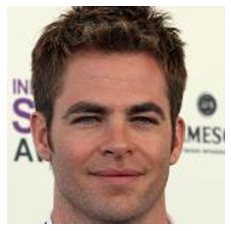

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


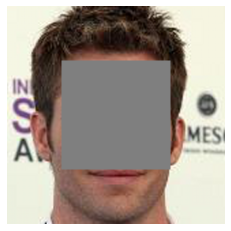

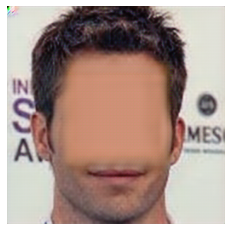

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0204],
        [0.0160],
        [0.0168],
        [0.0234],
        [0.0200],
        [0.0118],
        [0.0109],
        [0.0198],
        [0.9996],
        [0.9982],
        [0.9985],
        [0.9994],
        [0.9999],
        [0.9982],
        [0.9963],
        [0.9997]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.13442036509513855,           
 fml_loss: 0.9079702198505402,
 sgrl_loss: 3.8092173781478778,           
 gl_loss : 1.969674602150917,
 G_loss: 2.3237812519073486







  0%|          | 7/2533 [00:39<3:27:22,  4.93s/it, D_pred=tensor([[0.0576],
        [0.1489],
        [0.0870],
        [0.7397],
        [0.1846],
        [0.2609],
        [0.1065],
        [0.2667],
        [0.9883],
        [0.9837],
        [0.9848],
        [0.9889],
        [0.9973],
        [0.9783],
        [0.8821],
        [0.9957]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 8/2533 [00:39<3:26:34,  4.91s/it, D_pred=tensor([[0.0576],
        [0.1489],
        [0.0870],
        [0.7397],
        [0.1846],
        [0.2609],
        [0.1065],
        [0.2667],
        [0.9883],
        [0.9837],
        [0.9848],
        [0.9889],
        [0.9973],
        [0.9783],
        [0.8821],
        [0.9957]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

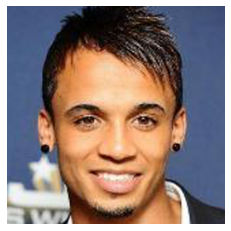

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


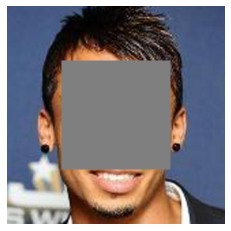

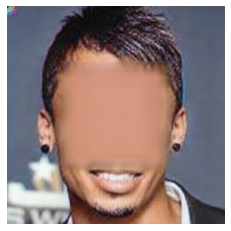

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0184],
        [0.0133],
        [0.0303],
        [0.0211],
        [0.0287],
        [0.0150],
        [0.0330],
        [0.0833],
        [0.9999],
        [0.9971],
        [0.9998],
        [0.9996],
        [0.9991],
        [0.9937],
        [0.9996],
        [0.9937]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.144339457154274,           
 fml_loss: 0.9919696487486362,
 sgrl_loss: 4.7608067688997835,           
 gl_loss : 1.8546964041888714,
 G_loss: 2.245037794113159







  0%|          | 8/2533 [00:44<3:26:34,  4.91s/it, D_pred=tensor([[0.0701],
        [0.0548],
        [0.3796],
        [0.5102],
        [0.6284],
        [0.2269],
        [0.1958],
        [0.8557],
        [0.9995],
        [0.9274],
        [0.9969],
        [0.9952],
        [0.9939],
        [0.8783],
        [0.9483],
        [0.8203]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 9/2533 [00:44<3:26:18,  4.90s/it, D_pred=tensor([[0.0701],
        [0.0548],
        [0.3796],
        [0.5102],
        [0.6284],
        [0.2269],
        [0.1958],
        [0.8557],
        [0.9995],
        [0.9274],
        [0.9969],
        [0.9952],
        [0.9939],
        [0.8783],
        [0.9483],
        [0.8203]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..

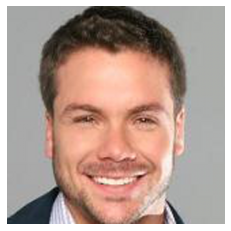

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


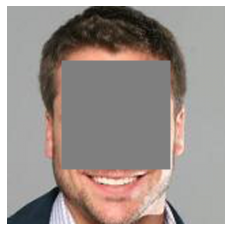

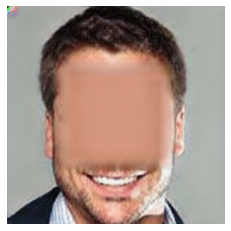

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0202],
        [0.0571],
        [0.0129],
        [0.0377],
        [0.0570],
        [0.0532],
        [0.0618],
        [0.0491],
        [0.9983],
        [0.9989],
        [0.9974],
        [0.9951],
        [0.9994],
        [0.9999],
        [0.9997],
        [0.9987]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.12081582844257355,           
 fml_loss: 0.9315487928688526,
 sgrl_loss: 3.733966514118947,           
 gl_loss : 1.6754326410591602,
 G_loss: 2.019897937774658







  0%|          | 9/2533 [00:49<3:26:18,  4.90s/it, D_pred=tensor([[0.0881],
        [0.3992],
        [0.0666],
        [0.2721],
        [0.4943],
        [0.7699],
        [0.3056],
        [0.6254],
        [0.9874],
        [0.9808],
        [0.8909],
        [0.9389],
        [0.9910],
        [0.9974],
        [0.9933],
        [0.9907]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 10/2533 [00:49<3:25:54,  4.90s/it, D_pred=tensor([[0.0881],
        [0.3992],
        [0.0666],
        [0.2721],
        [0.4943],
        [0.7699],
        [0.3056],
        [0.6254],
        [0.9874],
        [0.9808],
        [0.8909],
        [0.9389],
        [0.9910],
        [0.9974],
        [0.9933],
        [0.9907]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0.

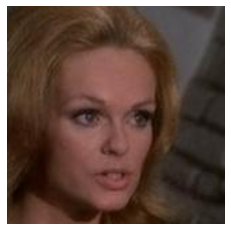

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


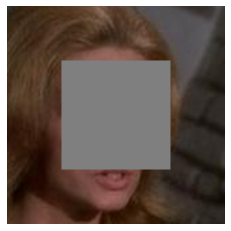

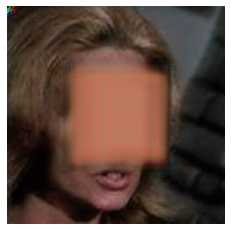

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0778],
        [0.0133],
        [0.0191],
        [0.0221],
        [0.0484],
        [0.0406],
        [0.0333],
        [0.0352],
        [0.9987],
        [0.9981],
        [0.9983],
        [0.9982],
        [1.0000],
        [0.9958],
        [0.9988],
        [0.9994]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.1324501931667328,           
 fml_loss: 0.9448377415537834,
 sgrl_loss: 2.8277070668991655,           
 gl_loss : 2.0504438783973455,
 G_loss: 2.4001386165618896







  0%|          | 10/2533 [00:54<3:25:54,  4.90s/it, D_pred=tensor([[0.5824],
        [0.1206],
        [0.2183],
        [0.4283],
        [0.4160],
        [0.1886],
        [0.4310],
        [0.3189],
        [0.9763],
        [0.9726],
        [0.9657],
        [0.9844],
        [0.9961],
        [0.8852],
        [0.9928],
        [0.9948]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 11/2533 [00:54<3:25:32,  4.89s/it, D_pred=tensor([[0.5824],
        [0.1206],
        [0.2183],
        [0.4283],
        [0.4160],
        [0.1886],
        [0.4310],
        [0.3189],
        [0.9763],
        [0.9726],
        [0.9657],
        [0.9844],
        [0.9961],
        [0.8852],
        [0.9928],
        [0.9948]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

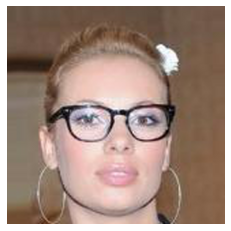

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


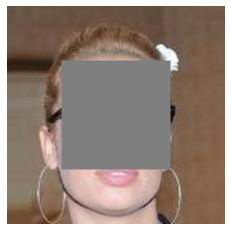

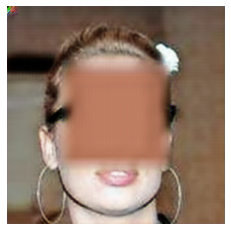

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0490],
        [0.0128],
        [0.0414],
        [0.0154],
        [0.0888],
        [0.0316],
        [0.0181],
        [0.0181],
        [1.0000],
        [0.9965],
        [0.9984],
        [0.9998],
        [0.9986],
        [0.9936],
        [0.9976],
        [0.9970]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.13246986269950867,           
 fml_loss: 0.8386030793190002,
 sgrl_loss: 4.222302231937647,           
 gl_loss : 2.1015556063503027,
 G_loss: 2.4439690113067627







  0%|          | 11/2533 [00:59<3:25:32,  4.89s/it, D_pred=tensor([[0.3657],
        [0.1349],
        [0.4091],
        [0.2715],
        [0.5742],
        [0.3189],
        [0.2055],
        [0.1788],
        [0.9993],
        [0.9743],
        [0.9708],
        [0.9860],
        [0.9893],
        [0.8500],
        [0.9459],
        [0.9442]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  0%|          | 12/2533 [00:59<3:24:24,  4.86s/it, D_pred=tensor([[0.3657],
        [0.1349],
        [0.4091],
        [0.2715],
        [0.5742],
        [0.3189],
        [0.2055],
        [0.1788],
        [0.9993],
        [0.9743],
        [0.9708],
        [0.9860],
        [0.9893],
        [0.8500],
        [0.9459],
        [0.9442]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

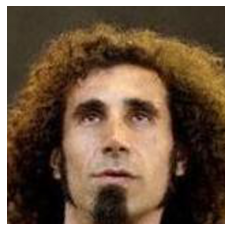

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


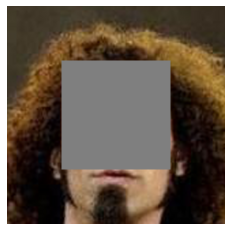

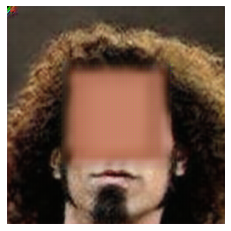

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0258],
        [0.0116],
        [0.0182],
        [0.0273],
        [0.0098],
        [0.0077],
        [0.0167],
        [0.0162],
        [0.9991],
        [0.9962],
        [0.9979],
        [0.9998],
        [0.9984],
        [0.9976],
        [0.9955],
        [0.9987]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.11368852853775024,           
 fml_loss: 0.8896205574274063,
 sgrl_loss: 2.693258647923358,           
 gl_loss : 1.638905145227909,
 G_loss: 1.9574503898620605







  0%|          | 12/2533 [01:04<3:24:24,  4.86s/it, D_pred=tensor([[0.3759],
        [0.2262],
        [0.2211],
        [0.6071],
        [0.3114],
        [0.1663],
        [0.2004],
        [0.1736],
        [0.9947],
        [0.9675],
        [0.9832],
        [0.9983],
        [0.9869],
        [0.9743],
        [0.9801],
        [0.9882]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 13/2533 [01:04<3:24:50,  4.88s/it, D_pred=tensor([[0.3759],
        [0.2262],
        [0.2211],
        [0.6071],
        [0.3114],
        [0.1663],
        [0.2004],
        [0.1736],
        [0.9947],
        [0.9675],
        [0.9832],
        [0.9983],
        [0.9869],
        [0.9743],
        [0.9801],
        [0.9882]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

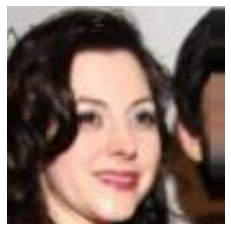

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


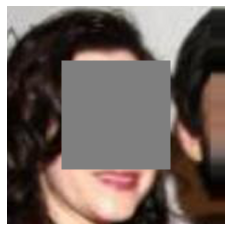

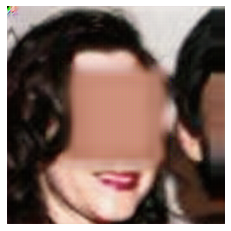

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0201],
        [0.0070],
        [0.0258],
        [0.0179],
        [0.0199],
        [0.0104],
        [0.0173],
        [0.0272],
        [0.9997],
        [0.9995],
        [0.9997],
        [0.9995],
        [0.9997],
        [0.9993],
        [0.9995],
        [0.9991]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.12923447787761688,           
 fml_loss: 0.915390532463789,
 sgrl_loss: 3.420501889195293,           
 gl_loss : 1.7821278423070908,
 G_loss: 2.128645420074463







  1%|          | 13/2533 [01:09<3:24:50,  4.88s/it, D_pred=tensor([[0.7607],
        [0.0703],
        [0.2749],
        [0.1605],
        [0.4153],
        [0.2312],
        [0.1085],
        [0.3356],
        [0.9933],
        [0.9899],
        [0.9949],
        [0.9932],
        [0.9854],
        [0.9821],
        [0.9701],
        [0.9714]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 14/2533 [01:09<3:24:33,  4.87s/it, D_pred=tensor([[0.7607],
        [0.0703],
        [0.2749],
        [0.1605],
        [0.4153],
        [0.2312],
        [0.1085],
        [0.3356],
        [0.9933],
        [0.9899],
        [0.9949],
        [0.9932],
        [0.9854],
        [0.9821],
        [0.9701],
        [0.9714]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

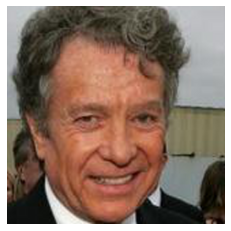

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


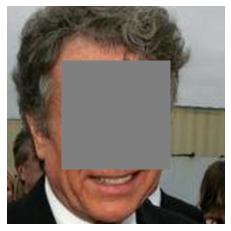

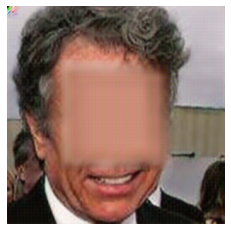

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0085],
        [0.0222],
        [0.0240],
        [0.0084],
        [0.0092],
        [0.0220],
        [0.0093],
        [0.0117],
        [0.9970],
        [1.0000],
        [0.9999],
        [0.9959],
        [0.9964],
        [0.9995],
        [0.9975],
        [0.9946]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.12068502604961395,           
 fml_loss: 1.0024672374129295,
 sgrl_loss: 2.582747947599273,           
 gl_loss : 1.5063820872455835,
 G_loss: 1.8533880710601807







  1%|          | 14/2533 [01:14<3:24:33,  4.87s/it, D_pred=tensor([[0.0600],
        [0.8598],
        [0.5156],
        [0.0539],
        [0.4438],
        [0.5347],
        [0.0797],
        [0.2790],
        [0.9671],
        [0.9998],
        [0.9964],
        [0.8949],
        [0.9445],
        [0.9918],
        [0.9739],
        [0.9430]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 15/2533 [01:14<3:24:36,  4.88s/it, D_pred=tensor([[0.0600],
        [0.8598],
        [0.5156],
        [0.0539],
        [0.4438],
        [0.5347],
        [0.0797],
        [0.2790],
        [0.9671],
        [0.9998],
        [0.9964],
        [0.8949],
        [0.9445],
        [0.9918],
        [0.9739],
        [0.9430]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

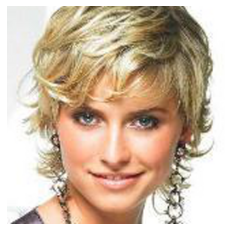

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


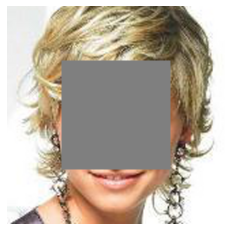

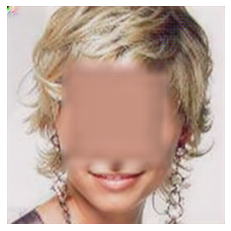

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0196],
        [0.0944],
        [0.0351],
        [0.0162],
        [0.0191],
        [0.0098],
        [0.0210],
        [0.0182],
        [0.9998],
        [0.9996],
        [1.0000],
        [0.9942],
        [0.9997],
        [0.9984],
        [0.9987],
        [0.9994]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.15153896808624268,           
 fml_loss: 1.0127668268978596,
 sgrl_loss: 4.508887650445104,           
 gl_loss : 1.9850315060466528,
 G_loss: 2.3842127323150635







  1%|          | 15/2533 [01:19<3:24:36,  4.88s/it, D_pred=tensor([[0.0689],
        [0.7965],
        [0.3067],
        [0.2765],
        [0.5514],
        [0.0469],
        [0.2184],
        [0.0989],
        [0.9923],
        [0.9924],
        [0.9984],
        [0.8894],
        [0.9869],
        [0.9390],
        [0.9169],
        [0.9687]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 16/2533 [01:19<3:26:13,  4.92s/it, D_pred=tensor([[0.0689],
        [0.7965],
        [0.3067],
        [0.2765],
        [0.5514],
        [0.0469],
        [0.2184],
        [0.0989],
        [0.9923],
        [0.9924],
        [0.9984],
        [0.8894],
        [0.9869],
        [0.9390],
        [0.9169],
        [0.9687]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

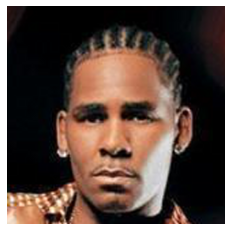

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


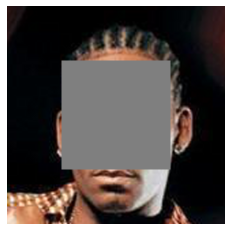

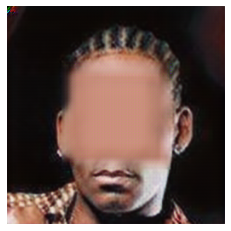

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0183],
        [0.0192],
        [0.0073],
        [0.0401],
        [0.0871],
        [0.0391],
        [0.0140],
        [0.0197],
        [0.9997],
        [0.9862],
        [0.9981],
        [0.9999],
        [1.0000],
        [0.9988],
        [0.9971],
        [1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.1418771743774414,           
 fml_loss: 0.9333580732345581,
 sgrl_loss: 4.207855454296805,           
 gl_loss : 2.0736406557261944,
 G_loss: 2.444267988204956







  1%|          | 16/2533 [01:23<3:26:13,  4.92s/it, D_pred=tensor([[0.2282],
        [0.2613],
        [0.0823],
        [0.4328],
        [0.7967],
        [0.6499],
        [0.1024],
        [0.0524],
        [0.9928],
        [0.8024],
        [0.9821],
        [0.9987],
        [0.9983],
        [0.9694],
        [0.9261],
        [0.9940]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 17/2533 [01:23<3:24:54,  4.89s/it, D_pred=tensor([[0.2282],
        [0.2613],
        [0.0823],
        [0.4328],
        [0.7967],
        [0.6499],
        [0.1024],
        [0.0524],
        [0.9928],
        [0.8024],
        [0.9821],
        [0.9987],
        [0.9983],
        [0.9694],
        [0.9261],
        [0.9940]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

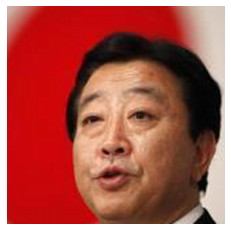

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


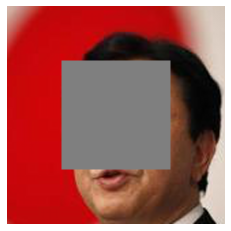

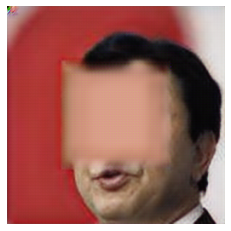

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.1606],
        [0.1929],
        [0.0189],
        [0.0319],
        [0.0212],
        [0.0076],
        [0.0095],
        [0.0744],
        [1.0000],
        [0.9998],
        [0.9996],
        [1.0000],
        [0.9996],
        [0.9986],
        [0.9988],
        [1.0000]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.15619994699954987,           
 fml_loss: 1.0810397565364838,
 sgrl_loss: 4.279737913748249,           
 gl_loss : 1.9841479137539864,
 G_loss: 2.399353265762329







  1%|          | 17/2533 [01:28<3:24:54,  4.89s/it, D_pred=tensor([[0.7090],
        [0.9149],
        [0.2457],
        [0.2462],
        [0.2472],
        [0.0492],
        [0.0476],
        [0.6514],
        [0.9951],
        [0.9907],
        [0.9757],
        [0.9915],
        [0.9751],
        [0.9146],
        [0.8111],
        [0.9992]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 18/2533 [01:28<3:23:57,  4.87s/it, D_pred=tensor([[0.7090],
        [0.9149],
        [0.2457],
        [0.2462],
        [0.2472],
        [0.0492],
        [0.0476],
        [0.6514],
        [0.9951],
        [0.9907],
        [0.9757],
        [0.9915],
        [0.9751],
        [0.9146],
        [0.8111],
        [0.9992]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

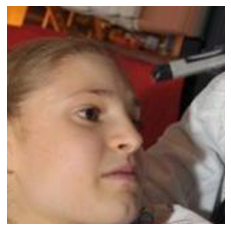

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


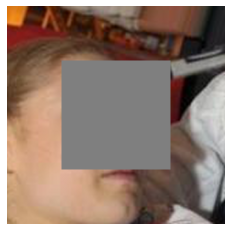

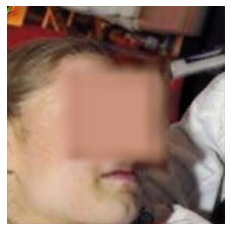

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0

 train_G_D: tensor([[0.0149],
        [0.0283],
        [0.0632],
        [0.0356],
        [0.0256],
        [0.0226],
        [0.0239],
        [0.0458],
        [0.9905],
        [0.9875],
        [0.9995],
        [0.9994],
        [0.9996],
        [0.9988],
        [0.9999],
        [0.9970]], device='cuda:0', grad_fn=<SigmoidBackward>)
 train_G_D():-1

 gal loss: 0.0,
 mse_loss: 0.12454482913017273,           
 fml_loss: 0.8418319746851921,
 sgrl_loss: 2.6622728910297155,           
 gl_loss : 1.4398477971553802,
 G_loss: 1.7593817710876465







  1%|          | 18/2533 [01:33<3:23:57,  4.87s/it, D_pred=tensor([[0.1197],
        [0.3012],
        [0.3180],
        [0.2713],
        [0.7725],
        [0.6440],
        [0.1832],
        [0.7054],
        [0.9493],
        [0.8033],
        [0.9898],
        [0.9717],
        [0.9911],
        [0.9911],
        [0.9984],
        [0.9763]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]




  1%|          | 19/2533 [01:33<3:28:19,  4.97s/it, D_pred=tensor([[0.1197],
        [0.3012],
        [0.3180],
        [0.2713],
        [0.7725],
        [0.6440],
        [0.1832],
        [0.7054],
        [0.9493],
        [0.8033],
        [0.9898],
        [0.9717],
        [0.9911],
        [0.9911],
        [0.9984],
        [0.9763]], device='cuda:0', grad_fn=<SigmoidBackward>), D_los=tensor(0., device='cuda:0', grad_fn=<MulBackward0>)]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0

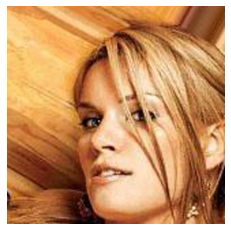

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


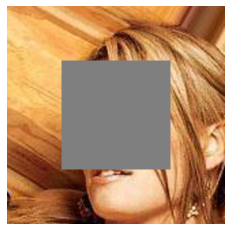

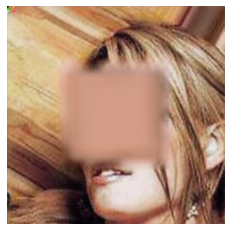

torch.Size([8, 512, 2, 2])
dfdfdf

 D_loss :0.0


KeyboardInterrupt: ignored

In [ ]:
loss_history = train_loop1(celeba_loader, G, D, *opt,epochs=10000, show_progress_bar=True, )

In [ ]:
imshow(G(image['gt'].to(DEVICE))[0].cpu())

cutt = cut_images(G(image['masked'].to(DEVICE)),masks = mask)
imshow(cutt.cpu()[0])
# D.forward(G(image['masked'].to(DEVICE)),cutt)
# image['']
# requires_grad(D, True)
D.eval()
l = D.local_branch(cutt)
g  = D.global_branch(G(image['masked']).to(DEVICE))

l1  = D.dense_local_branch(l.view(1,-1))
g1 = D.dense_global_branch(g.view(1,-1))

D.neck(torch.cat([l1,g1],1))


In [ ]:

batch_sz = 1

requires_grad(G, False)
requires_grad(D, True)
# images = torch.cat([G(image['masked'].to(DEVICE)).to(DEVICE), image['gt'].to(DEVICE)],0)
images = image['gt'].to(DEVICE)
masked = image['masked'].to(DEVICE)
gen_images = G(masked)
# gen_predictions = D(gen_images)
# gt_predictions = D(images)
# imshow(images[0].cpu())
# imshow(gen_images[0].cpu())
masks  = image['mask']
cut_gt_images = cut_images(images, masks)
cut_gen_images = cut_images(gen_images, masks)

true_label = torch.ones(images.size(0)).to(DEVICE)
fake_label = torch.zeros_like(true_label).to(DEVICE)

D.zero_grad()
fmloss, D_gen_label, D_gt_label = fml(cut_gen_images, cut_gt_images, 
                                        D.local_branch)

x_local = D.dense_local_branch(torch.cat((D_gen_label.view(batch_sz, -1),
                                    D_gt_label.view(batch_sz, -1)), dim=0))

x_global = D.global_branch(torch.cat((gen_images, images), dim=0))
x_global = D.dense_global_branch(x_global.view(x_global.size(0), -1))

print(x_local.size(), x_global.size())
y = D.neck(torch.cat([x_local, x_global], dim=1))
pres=D.last_act(y)
pres


# D.dense_local_branch


###ghghgh

#fg

In [ ]:
imshow(G(torch.unsqueeze(img, 0).cuda()).cpu().detach()[0])
imshow(gt)
running_D_loss = 0.0
running_G_loss = 0.0
for i, data in enumerate(celeba_loader):

    G.train()
    D.train()
    batch_sz = data["gt"].size(0)

    images = data["gt"].to(DEVICE)
    masked = data["masked"].to(DEVICE)
    masks = data["mask"].to(DEVICE)

    batch_sz = images.size(0)
    # print(batch_sz)

    requires_grad(G, False)
    requires_grad(D, True)

    gen_images = G(masked)
    # gen_predictions = D(gen_images)
    # gt_predictions = D(images)

    cut_gt_images = cut_images(images, masks)
    cut_gen_images = cut_images(gen_images, masks)

    true_label = torch.ones(images.size(0)).to(DEVICE)
    fake_label = torch.zeros_like(true_label).to(DEVICE)
    # print(cut_gt_images.size())

    D.zero_grad()
    # fmloss, D_gen_label, D_gt_label = fml(cut_gen_images, cut_gt_images, 
    #                                         D.local_branch)
    x_local = D.local_branch(torch.cat((cut_gen_images, cut_gt_images),0))
    # print(x_local.view(2*batch_sz, - 1).size(), D.dense_local_branch)
    x_local = D.dense_local_branch(x_local.view(2*batch_sz, -1))
    
    x_global = D.global_branch(torch.cat((gen_images, images), dim=0))
    x_global = D.dense_global_branch(x_global.view(x_global.size(0), -1))

    y = D.neck(torch.cat([x_local, x_global], dim=1))

    D_loss =  dal(torch.cat([fake_label,true_label], dim=0).view(-1), y) 
    D_loss.backward()
    D_opt.step()
    print(D(gen_images,cut_gen_images))



In [ ]:
torch.save({'model_state_dict': G.state_dict(),
            'opt_state_dict': G_opt.state_dict(),}, '/content/drive/MyDrive/RaGAN/Gen')

In [ ]:
import os
os.mkdir('/content/drive/MyDrive/RaGAN/pics')

In [ ]:
torch.manual_seed(0)

In [ ]:
for image in celeba_loader:
    mask = image["mask"].to(DEVICE)
    print(D(image["masked"].to(DEVICE), cut_images(image["gt"].to(DEVICE), mask).to(DEVICE)))
    print(D(image["gt"].to(DEVICE), cut_images(image["gt"].to(DEVICE), mask).to(DEVICE)))
    break

In [ ]:
torch.save({'model_state_dict': G.state_dict()}, '/content/Gen')

In [ ]:
chek = torch.load('/content/drive/MyDrive/RaGAN/Gen_____3')
gg = Generator(gen)
gg.load_state_dict(chek['G_model_state_dict'])
imshow(gg(torch.unsqueeze(img,0)).detach()[0])